# GIPL Output Quality Control
The purpose of this notebook is to execute a rigorous quality control (QC) process upon the dataset to ensure it is consistent, complete, and user-friendly for both humans and computers. The QC process attempts to verify that the data produced meets the [SNAP Quality Data Standard](https://github.com/ua-snap/snap-qaqc/blob/main/quality_standard.md).

In [1]:
import os
import re
import rasterio as rio
import threading
import concurrent.futures
import random
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from rasterio.plot import show

os.environ["NCORES"] = (os.getenv("NCORES") or "32")
os.environ["OUTPUT_DIR"] = (os.getenv("OUTPUT_DIR") or "/atlas_scratch/cparr4/new_gipl_eda_marchenko_revision/crrel_gipl_outputs/")
output_path = Path(os.environ["OUTPUT_DIR"])

### Verify that the expected number of files is created
There should be 1000 GeoTIFFs per model/scenario combination and 6000 GeoTIFFs in total.

In [2]:
output_fps = [x for x in Path(output_path).glob("*.tif")]

expected_number_of_files = 6000
assert len(output_fps) == expected_number_of_files

### Verify metadata is constant across the dataset

Each GeoTIFF must have identical header information, spatial extent, coordinate reference system, NoData value, compression, and spatial resolution.

In [3]:
def metadata_check(directory):
    all_meta = []
    fps = [x for x in directory.glob("*.tif")]
    read_lock = threading.Lock()

    def process(fp):
        src = rio.open(fp)
        with read_lock:
            profile = src.profile
            all_meta.append(profile)
    
    # We map the process() function over the list of files
    with concurrent.futures.ThreadPoolExecutor(
        max_workers=int(os.getenv("NCORES"))
    ) as executor:
        executor.map(process, fps)

    return all_meta


In [4]:
meta = metadata_check(output_path)

In [5]:
assert len(meta) == 6000
assert(all([x == meta[0] for x in meta]) == True)

### Verify that the frequency of nodata values is constant across the dataset

In this case we expect each GeoTIFF to contain the exact same number of NoData (-9999) values. There should be no discrepancies between different variables, models, or scenarios. We run this check to flag cases where a GeoTIFF was created that has valid metadata, but is missing some or all of the data. In the past we've seen unexpected stripes or blocks that contain NoData values, but should contain actual data.

In [6]:
def count_nodata_pixels(src):
    """This function will count the occcurences of the prescribed 'nodata' value in a raster.
    For example, a value of 10000 indicates that 10000 pixels have a nodata value."""
    arr = src.read(1)
    return np.sum((arr == src.meta["nodata"]) * 1)
    

def check_nodata_count(directory):
    all_nodata_counts = []
    fps = [x for x in directory.glob("*.tif")]
    read_lock = threading.Lock()

    def process(fp):
        src = rio.open(fp)
        with read_lock:
            all_nodata_counts.append(count_nodata_pixels(src))
    
    with concurrent.futures.ThreadPoolExecutor(
        max_workers=int(os.getenv("NCORES"))
    ) as executor:
        executor.map(process, fps)

    return all_nodata_counts

In [7]:
nodata_counts = check_nodata_count(output_path)

In [8]:
assert len(nodata_counts) == 6000

In [ ]:
assert len(np.unique(nodata_counts)) == 1

### Verify the dataset passes the eyeball test

It is good practice to verify that the data have visual integrity: spatial bounds and patterns of data values should be reasonable for the geographic area and type of quantity or variable represented by the data. These figures are a good way to share progress on a dataset with others as well. There are many variables that we need to examine individually in this dataset. While we can't look at all 6000 GeoTIFFs, we will randomly sample nine GeoTIFFs from each of the ten variables. For the sampled data we will also generate histograms so we can connect the map visualization to the underlying statistical distribution. 

In [3]:
permafrost_variables = sorted(list(set([x.name.split("_")[3] for x in output_fps])))
permafrost_variables

['magt0.5m',
 'magt1m',
 'magt2m',
 'magt3m',
 'magt4m',
 'magt5m',
 'magtsurface',
 'permafrostbase',
 'permafrosttop',
 'talikthickness']

In [4]:
def plot_maps(out_dir, pf_var, title_split_idx):
    fig, axs = plt.subplots(4, 3, figsize=(16, 16), sharex=True, sharey=True)
    
    out_fps = sorted(list(out_dir.glob(f"*{pf_var}*.tif")))
    arrs = []
    titles = []
    for ax in axs.flatten():
        i = np.random.randint(len(out_fps))
        fp = out_fps[i]
        with rio.open(fp) as src:
            show(src, ax=ax, interpolation="none")
            arrs.append(src.read(1))
        title = " ".join(fp.name.split(".")[0].split("_")[title_split_idx:])
        ax.set_title(title)
        titles.append(title)

    plt.show()
    
    return arrs, titles
    


def plot_histograms(arrs, titles):
    fig, axs = plt.subplots(4, 3, figsize=(20, 16))
    for ax, arr, title in zip(axs.flatten(), arrs, titles):
        arr = arr.flatten()
        arr = arr[arr != -9999]
        ax.hist(arr)
        ax.set_title(title)

    plt.show()

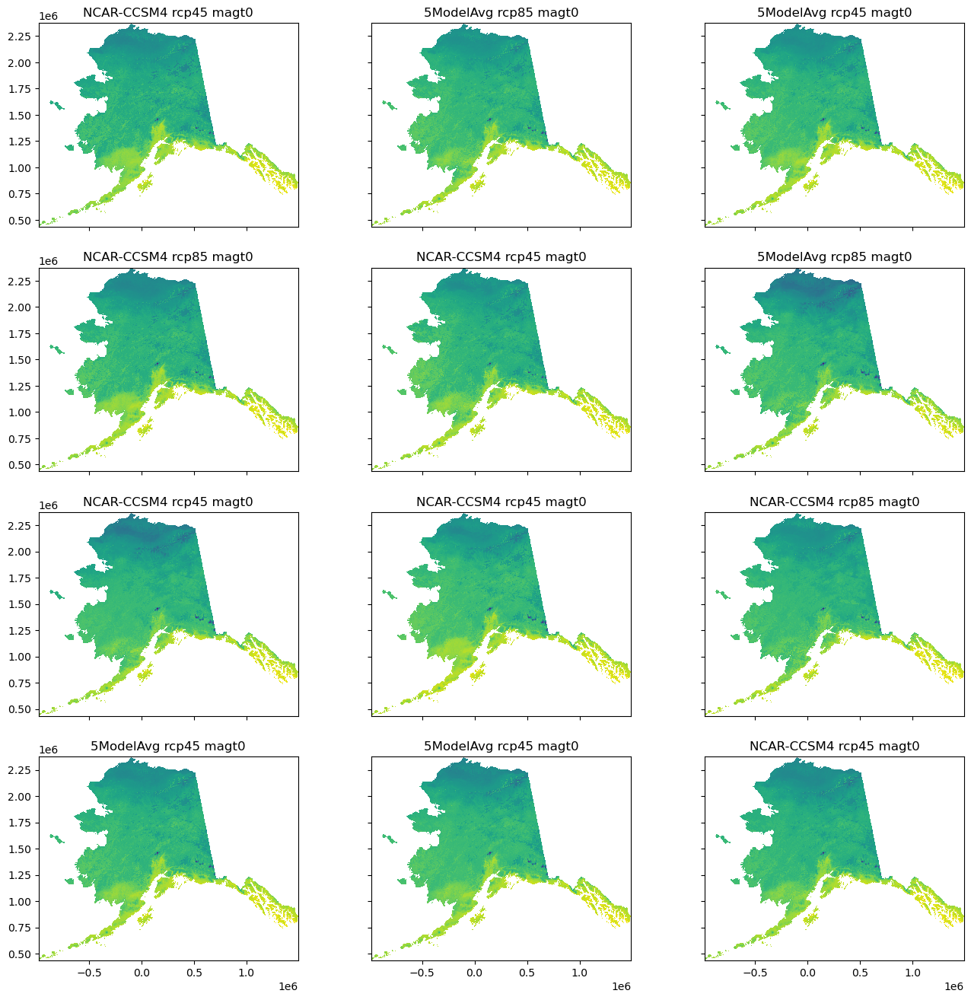

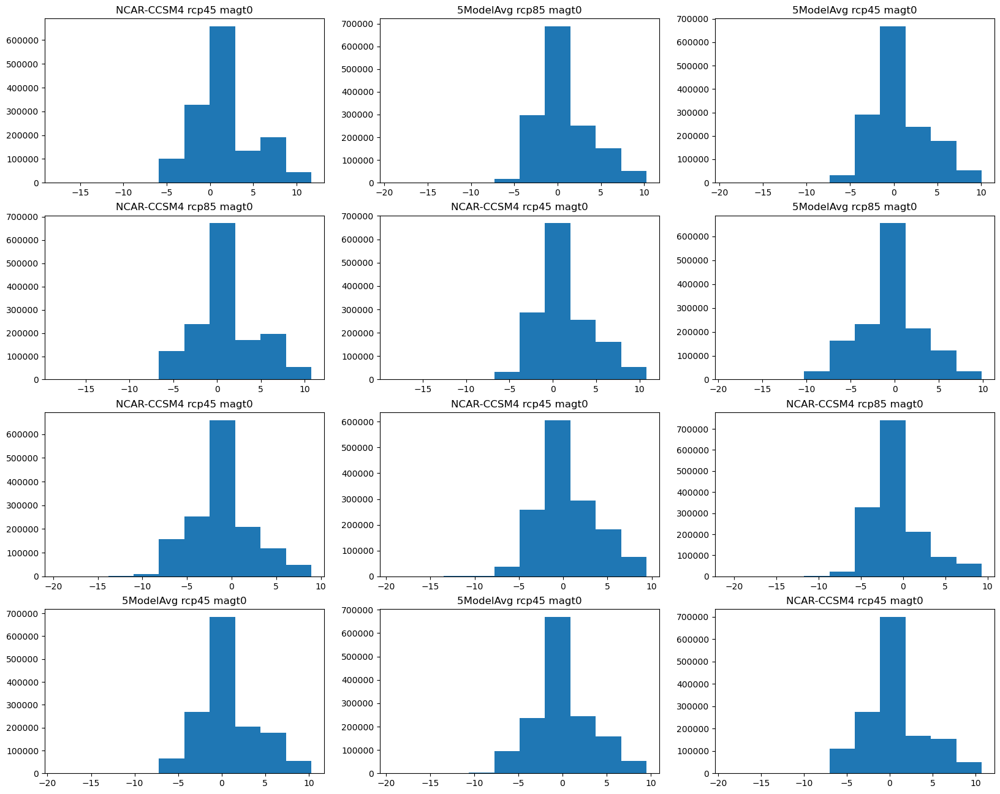

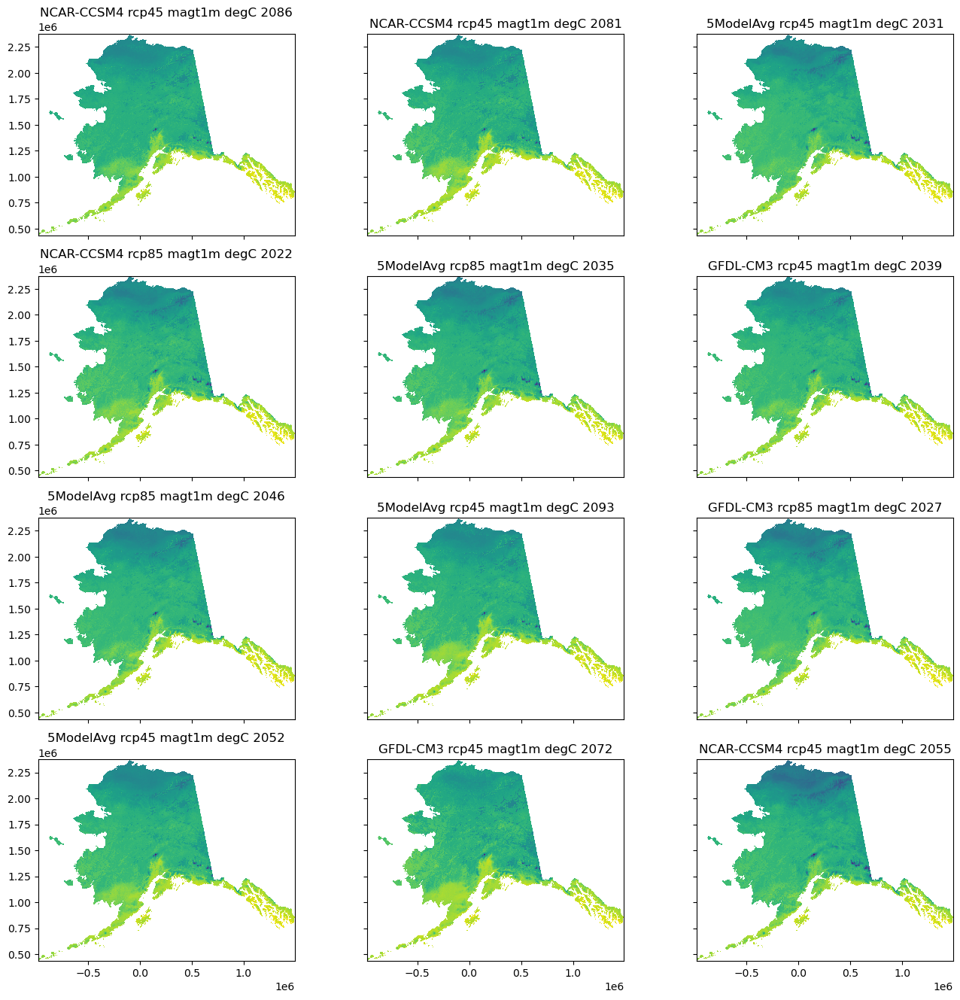

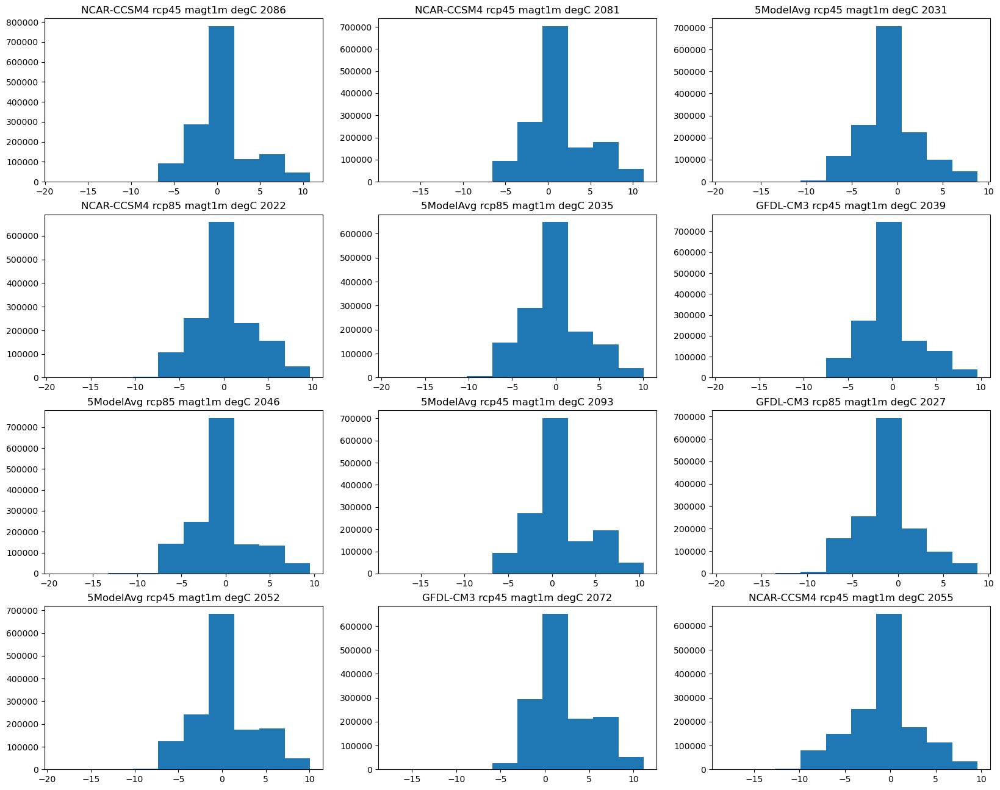

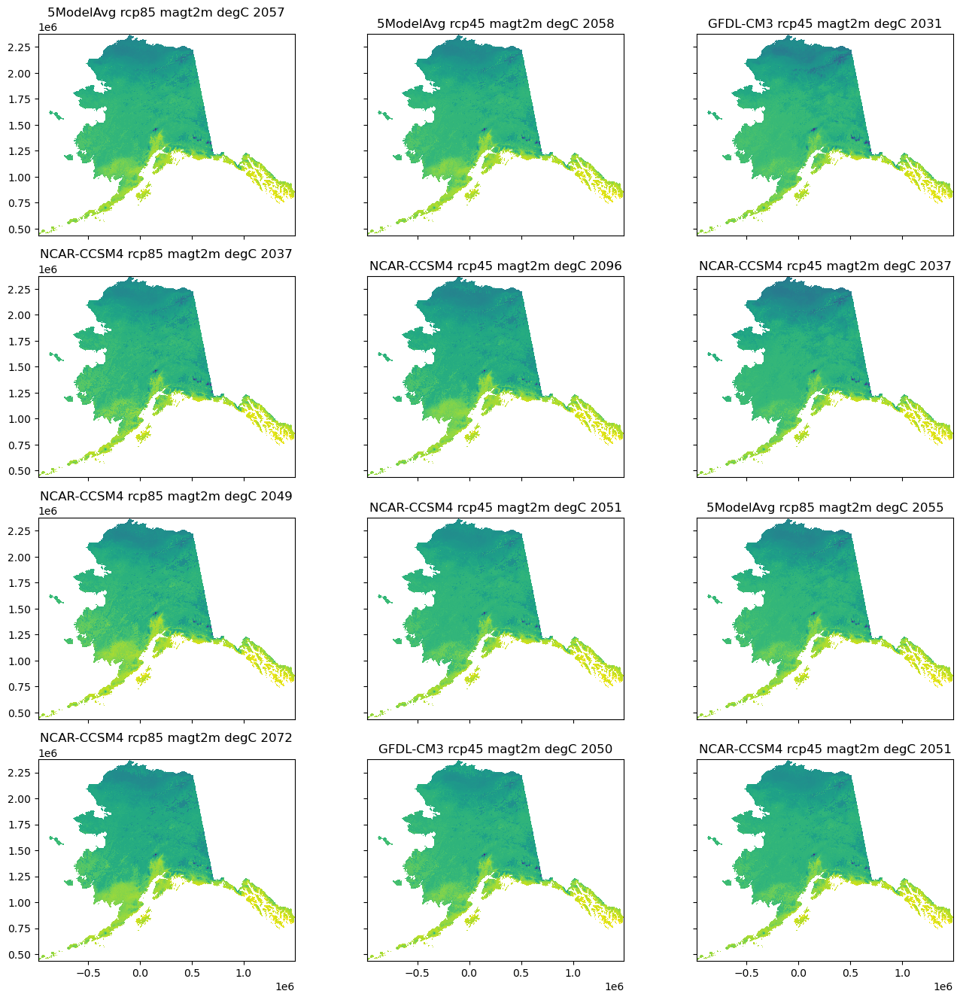

...

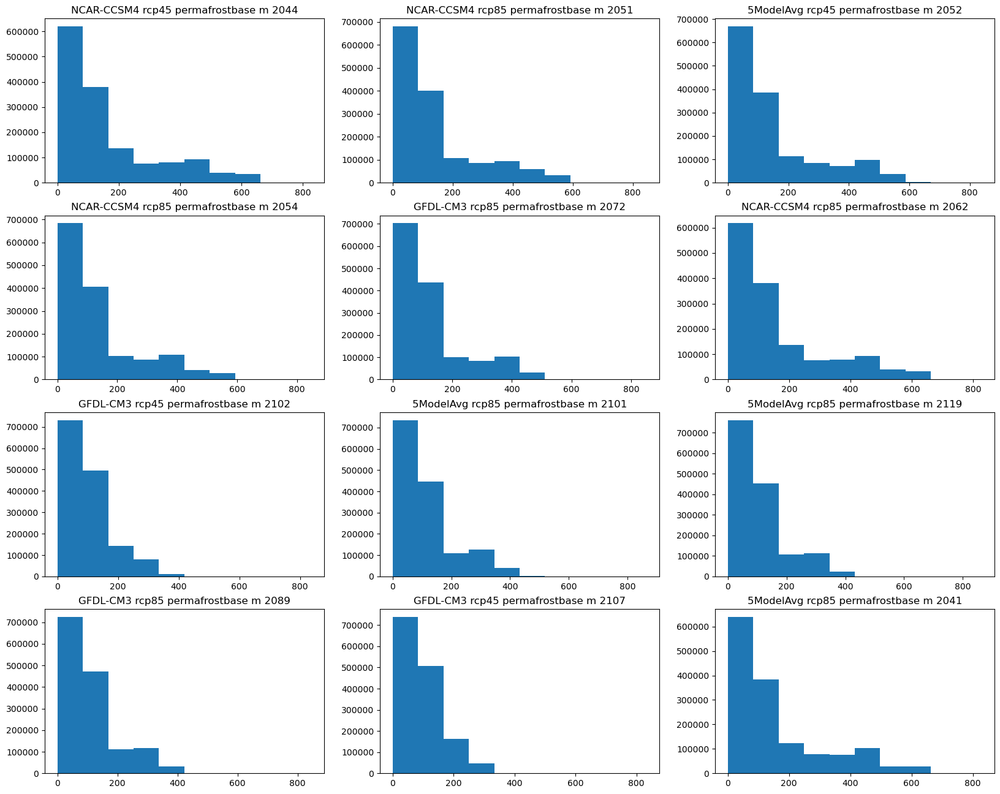

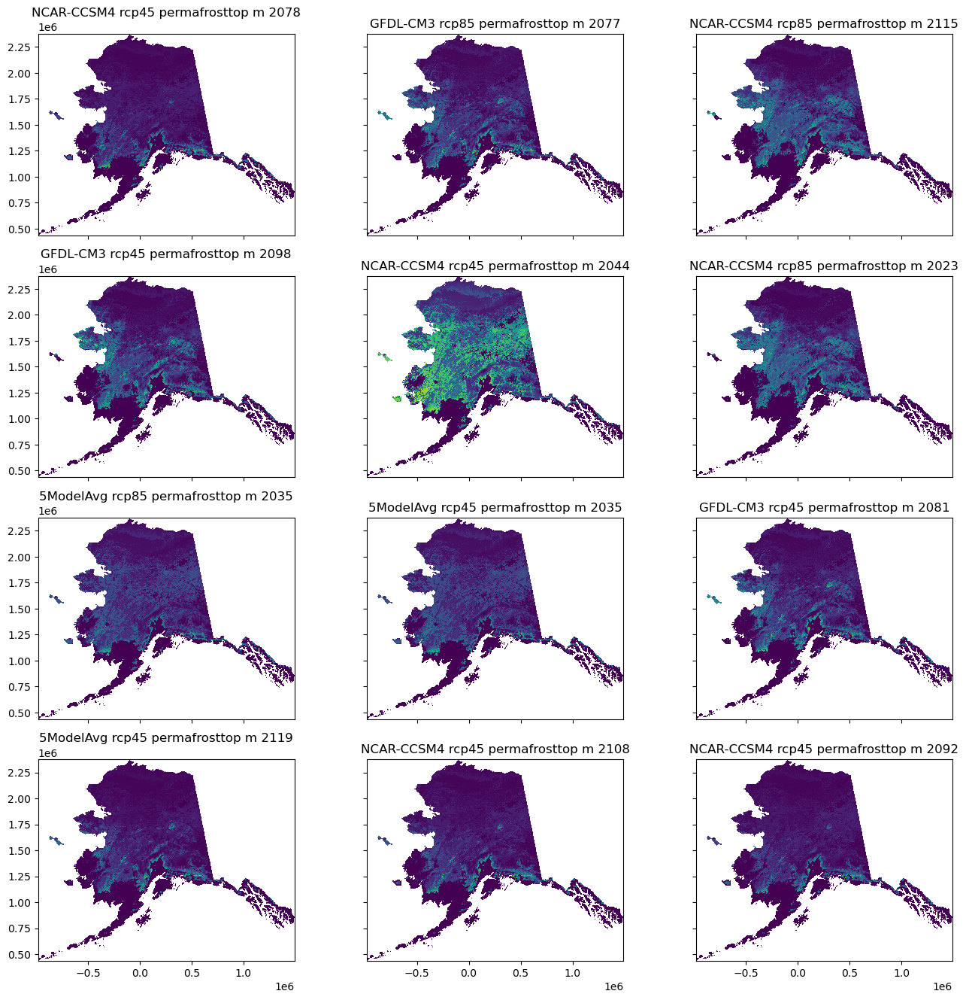

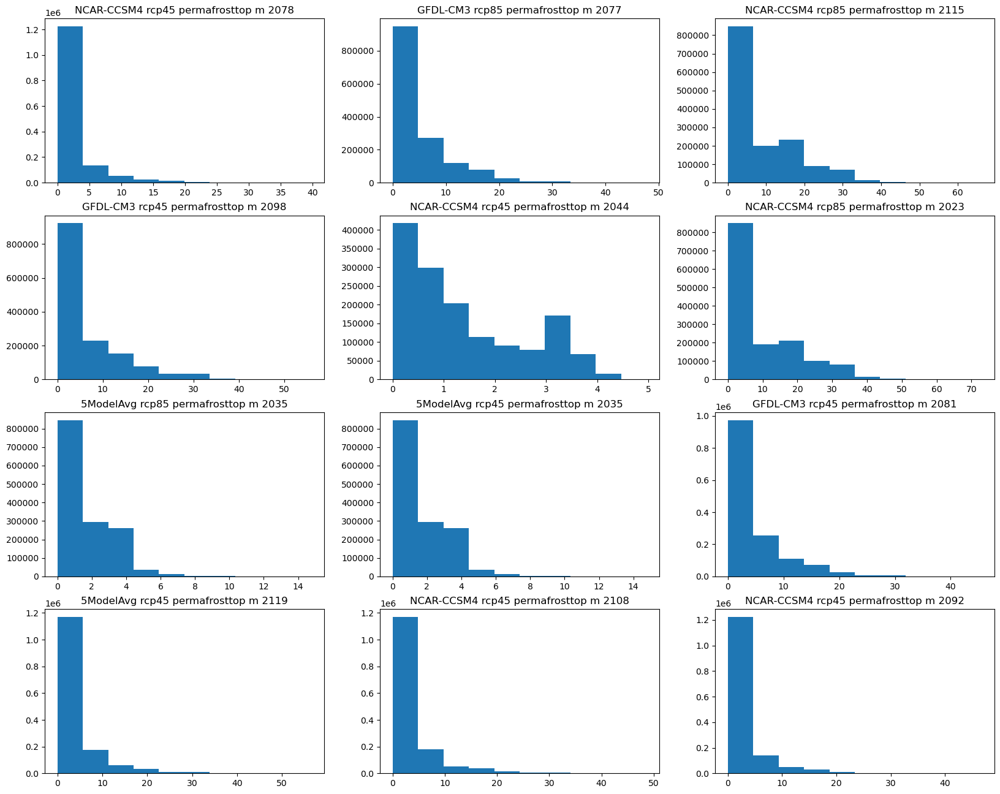

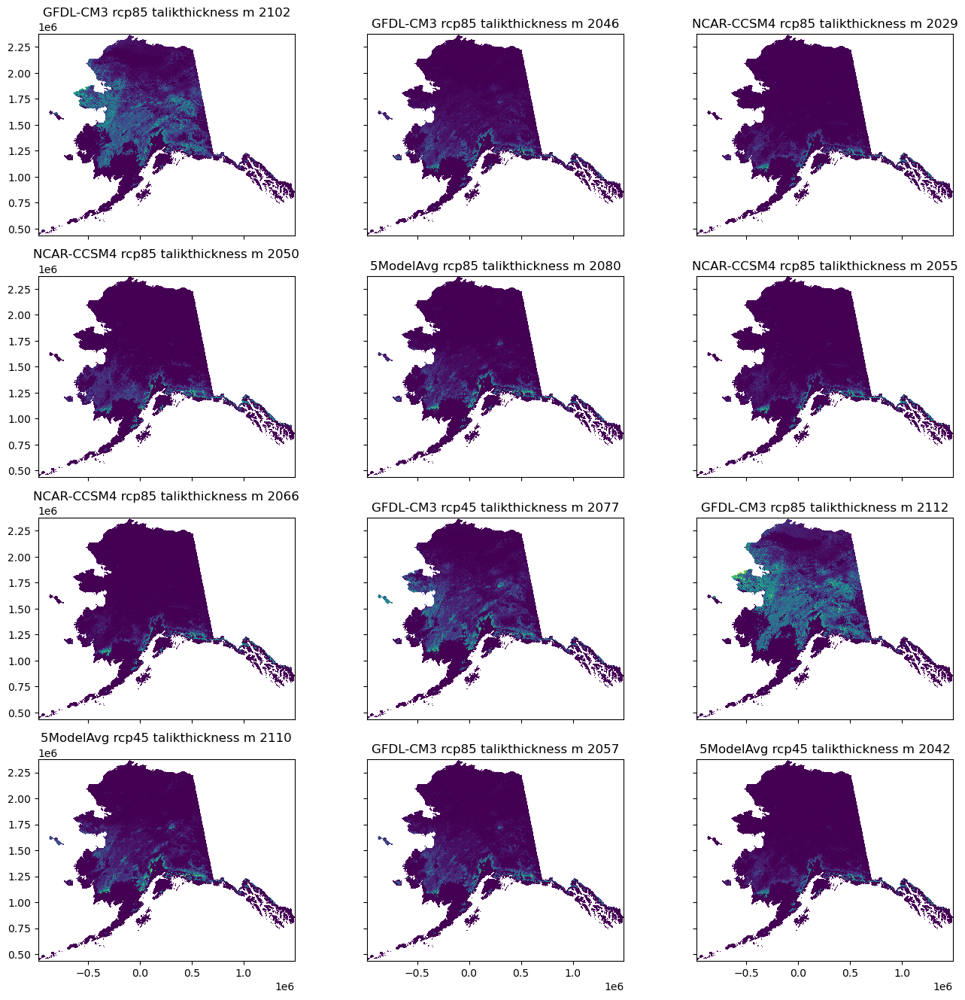

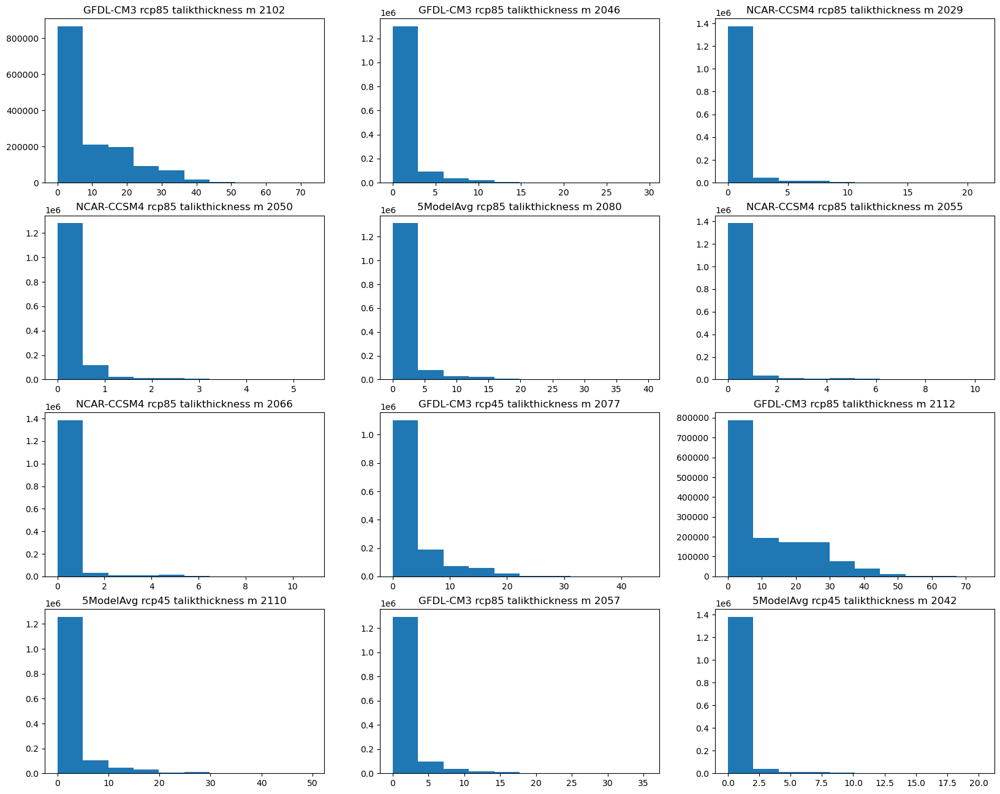

In [6]:
for pf_var in permafrost_variables:
    arrs, titles = plot_maps(output_path, f"{pf_var}", 1)
    plot_histograms(arrs, titles)